In [46]:
import sys
sys.path.append('../src')

In [47]:
from loaders import load_cmu

df = load_cmu('../data/raw/cmu/cmu_strong_password.csv')
df.head()

,user_id,session_id,mean_hold_time,mean_inter_key_interval,std_inter_key_interval,total_duration
0,s002,1_1,0.115782,0.54039,0.493923,5.4039
1,s002,1_2,0.100100,0.43400,0.361336,4.3400
2,s002,1_3,0.111109,0.39526,0.298385,3.9526
3,s002,1_4,0.105400,0.46450,0.405723,4.6450
4,s002,1_5,0.092582,0.39389,0.311851,3.9389


In [48]:
print(f"Shape: {df.shape}")
print(f"Number of unique users: {df['user_id'].nunique()}")
print(f"Sessions per user (first 5 users):")
print(df.groupby('user_id').size().head())
print()
print("Feature statistics:")
print(df[['mean_hold_time', 'mean_inter_key_interval',
          'std_inter_key_interval', 'total_duration']].describe())

Shape: (20400, 6)
Number of unique users: 51
Sessions per user (first 5 users):
user_id
s002    400
s003    400
s004    400
s005    400
s007    400
dtype: int64

Feature statistics:
       mean_hold_time  mean_inter_key_interval  std_inter_key_interval  \
count    20400.000000             20400.000000            20400.000000   
mean         0.090096                 0.249192                0.149160   
std          0.020964                 0.114365                0.125637   
min          0.031591                 0.102220                0.034585   
25%          0.077334                 0.177830                0.084482   
50%          0.088645                 0.220970                0.119026   
75%          0.100773                 0.285372                0.175094   
max          0.296936                 3.591670                7.925693   

       total_duration  
count    20400.000000  
mean         2.491925  
std          1.143654  
min          1.022200  
25%          1.778300  
50%    

In [49]:
df.to_parquet('../data/processed/cmu_loaded.parquet')
print("Saved to data/processed/cmu_loaded.parquet")

Saved to data/processed/cmu_loaded.parquet


In [50]:
from loaders import load_aalto

aalto_df = load_aalto('../data/raw/aalto_ite/processed2020/english/test_sections_labeled.csv')
aalto_df.head()

Loading session-level data from ../data/raw/aalto_ite/processed2020/english/test_sections_labeled.csv...
Loaded 869113 sessions across 57997 users
Sampled to 300 users with 4500 total sessions
Final output: 4500 sessions from 300 users


,user_id,session_id,mean_hold_time,mean_inter_key_interval,std_inter_key_interval,total_duration
0,629,2512,0.125995,0.231617,0.231617,10.886
1,629,2513,0.117699,0.270708,0.270708,6.497
2,629,2515,0.139784,0.307051,0.307051,18.116
3,629,2516,0.146229,0.325881,0.325881,13.687
4,629,2520,0.145327,0.250410,0.250410,9.766


In [51]:
print(f"Shape: {aalto_df.shape}")
print(f"Unique users: {aalto_df['user_id'].nunique()}")
print(f"Sessions per user (first 5):")
print(aalto_df.groupby('user_id').size().head())
print()
print("Feature statistics:")
print(aalto_df[['mean_hold_time', 'mean_inter_key_interval',
                'std_inter_key_interval', 'total_duration']].describe())

Shape: (4500, 6)
Unique users: 300
Sessions per user (first 5):
user_id
1001    15
1017    15
1021    15
1034    15
1040    15
dtype: int64

Feature statistics:
       mean_hold_time  mean_inter_key_interval  std_inter_key_interval  \
count     4500.000000              4500.000000             4500.000000   
mean         0.167240                 0.374619                1.155811   
std          0.075286                 0.294510                1.502742   
min          0.033665                 0.110829                0.110829   
25%          0.113883                 0.247021                0.310092   
50%          0.151452                 0.329716                0.585355   
75%          0.202431                 0.442377                1.488290   
max          0.500000                14.814228               39.099848   

       total_duration  
count     4500.000000  
mean        16.701836  
std         16.789577  
min          1.888000  
25%          9.319000  
50%         14.097500  
75% 

In [52]:
aalto_df.to_parquet('../data/processed/aalto_loaded.parquet')
print("Saved to data/processed/aalto_loaded.parquet")

Saved to data/processed/aalto_loaded.parquet


In [53]:
from models import run_full_evaluation
import pandas as pd

# Reload the processed datasets
cmu_df = pd.read_parquet('../data/processed/cmu_loaded.parquet')
aalto_df = pd.read_parquet('../data/processed/aalto_loaded.parquet')

print(f"CMU: {len(cmu_df)} sessions from {cmu_df['user_id'].nunique()} users")
print(f"Aalto: {len(aalto_df)} sessions from {aalto_df['user_id'].nunique()} users")

CMU: 20400 sessions from 51 users
Aalto: 4500 sessions from 300 users


In [54]:
print("=" * 60)
print("Evaluating CMU dataset")
print("=" * 60)
cmu_results = run_full_evaluation(cmu_df, 'CMU')
print()
print("CMU results summary:")
print(cmu_results.groupby('classifier')[['accuracy', 'FAR', 'FRR', 'EER']].mean())

Evaluating CMU dataset
Training RandomForest for 51 users...
  Completed 50/51 users
  Done. Evaluated 51 users.
Training KNN for 51 users...
  Completed 50/51 users
  Done. Evaluated 51 users.
Training GradientBoosting for 51 users...
  Completed 50/51 users
  Done. Evaluated 51 users.

CMU results summary:
                  accuracy       FAR       FRR       EER
classifier                                              
GradientBoosting  0.867851  0.070153  0.318137  0.194145
KNN               0.863194  0.091993  0.271242  0.181618
RandomForest      0.868546  0.074183  0.303268  0.188725


In [55]:
print("=" * 60)
print("Evaluating Aalto dataset")
print("=" * 60)
aalto_results = run_full_evaluation(aalto_df, 'Aalto')
print()
print("Aalto results summary:")
print(aalto_results.groupby('classifier')[['accuracy', 'FAR', 'FRR', 'EER']].mean())

Evaluating Aalto dataset
Training RandomForest for 300 users...
  Completed 50/300 users
  Completed 100/300 users
  Completed 150/300 users
  Completed 200/300 users
  Completed 250/300 users
  Completed 300/300 users
  Done. Evaluated 300 users.
Training KNN for 300 users...
  Completed 50/300 users
  Completed 100/300 users
  Completed 150/300 users
  Completed 200/300 users
  Completed 250/300 users
  Completed 300/300 users
  Done. Evaluated 300 users.
Training GradientBoosting for 300 users...
  Completed 50/300 users
  Completed 100/300 users
  Completed 150/300 users
  Completed 200/300 users
  Completed 250/300 users
  Completed 300/300 users
  Done. Evaluated 300 users.

Aalto results summary:
                  accuracy       FAR       FRR       EER
classifier                                              
GradientBoosting  0.775556  0.134286  0.540000  0.337143
KNN               0.783704  0.109048  0.591667  0.350357
RandomForest      0.789630  0.113333  0.550000  0.331667


In [56]:
combined = pd.concat([cmu_results, aalto_results], ignore_index=True)
combined.to_csv('../data/results/baseline_metrics.csv', index=False)

# Also save a summary table for Chapter 5
summary = combined.groupby(['dataset', 'classifier'])[
    ['accuracy', 'FAR', 'FRR', 'EER']
].mean().round(4)
summary.to_csv('../data/results/baseline_summary.csv')

print("Saved results to data/results/")
print()
print("Summary table:")
print(summary)

Saved results to data/results/

Summary table:
                          accuracy     FAR     FRR     EER
dataset classifier                                        
Aalto   GradientBoosting    0.7756  0.1343  0.5400  0.3371
        KNN                 0.7837  0.1090  0.5917  0.3504
        RandomForest        0.7896  0.1133  0.5500  0.3317
CMU     GradientBoosting    0.8679  0.0702  0.3181  0.1941
        KNN                 0.8632  0.0920  0.2712  0.1816
        RandomForest        0.8685  0.0742  0.3033  0.1887


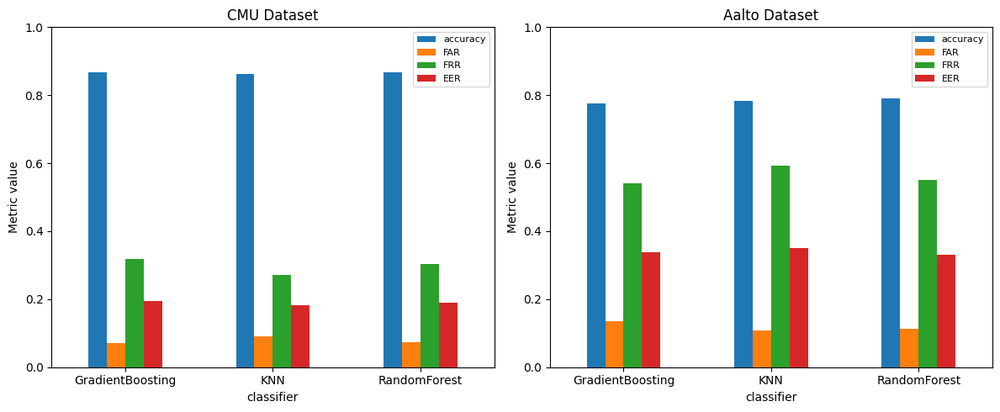

Saved plot to data/results/baseline_comparison.png


In [57]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

for ax, dataset_name in zip(axes, ['CMU', 'Aalto']):
    subset = summary.loc[dataset_name]
    subset[['accuracy', 'FAR', 'FRR', 'EER']].plot(kind='bar', ax=ax)
    ax.set_title(f'{dataset_name} Dataset')
    ax.set_ylabel('Metric value')
    ax.set_ylim(0, 1)
    ax.legend(loc='upper right', fontsize=8)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

plt.tight_layout()
plt.savefig('../data/results/baseline_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved plot to data/results/baseline_comparison.png")

In [ ]:
from privacy import run_privacy_evaluation
import pandas as pd

#Reload processed datasets
cmu_df = pd.read_parquet('../data/processed/cmu_loaded.parquet')
aalto_df = pd.read_parquet('../data/processed/aalto_loaded.parquet')

In [59]:
print("=" * 60)
print("CMU privacy evaluation")
print("=" * 60)
cmu_privacy_results = run_privacy_evaluation(cmu_df, 'CMU')

CMU privacy evaluation
Privacy evaluation on CMU:
  RandomForest at baseline - 51 users...
  RandomForest at eps=0.5 - 51 users...
  RandomForest at eps=1.0 - 51 users...
  RandomForest at eps=2.0 - 51 users...
  RandomForest at eps=5.0 - 51 users...
  KNN at baseline - 51 users...
  KNN at eps=0.5 - 51 users...
  KNN at eps=1.0 - 51 users...
  KNN at eps=2.0 - 51 users...
  KNN at eps=5.0 - 51 users...
  GradientBoosting at baseline - 51 users...
  GradientBoosting at eps=0.5 - 51 users...
  GradientBoosting at eps=1.0 - 51 users...
  GradientBoosting at eps=2.0 - 51 users...
  GradientBoosting at eps=5.0 - 51 users...


In [60]:
print("=" * 60)
print("Aalto privacy evaluation")
print("=" * 60)
aalto_privacy_results = run_privacy_evaluation(aalto_df, 'Aalto')

Aalto privacy evaluation
Privacy evaluation on Aalto:
  RandomForest at baseline - 300 users...
  RandomForest at eps=0.5 - 300 users...
  RandomForest at eps=1.0 - 300 users...


c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\

  RandomForest at eps=2.0 - 300 users...


c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\

  RandomForest at eps=5.0 - 300 users...


c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\

  KNN at baseline - 300 users...


c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\

  KNN at eps=0.5 - 300 users...


c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\

  KNN at eps=1.0 - 300 users...


c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\

  KNN at eps=2.0 - 300 users...


c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\

  KNN at eps=5.0 - 300 users...


c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\44749\Dissertation\ml-pipeline\

  GradientBoosting at baseline - 300 users...
  GradientBoosting at eps=0.5 - 300 users...
  GradientBoosting at eps=1.0 - 300 users...
  GradientBoosting at eps=2.0 - 300 users...
  GradientBoosting at eps=5.0 - 300 users...


In [ ]:
combined_privacy = pd.concat([cmu_privacy_results, aalto_privacy_results], ignore_index=True)
combined_privacy.to_csv('../data/results/privacy_metrics.csv', index=False)

#Build summary tableto include mean metrics per dataset, classifier, epsilon
summary = combined_privacy.groupby(['dataset', 'classifier', 'epsilon'])[
    ['accuracy', 'FAR', 'FRR', 'EER']
].mean().round(4).reset_index()

summary.to_csv('../data/results/privacy_summary.csv', index=False)

print("Privacy-accuracy summary:")
print(summary.to_string(index=False))

Privacy-accuracy summary:
dataset       classifier  epsilon  accuracy    FAR    FRR    EER
  Aalto GradientBoosting      0.5    0.7748 0.0443 0.8583 0.4513
  Aalto GradientBoosting      1.0    0.7485 0.1288 0.6808 0.4048
  Aalto GradientBoosting      2.0    0.7572 0.1364 0.6150 0.3757
  Aalto GradientBoosting      5.0    0.7528 0.1638 0.5392 0.3515
  Aalto GradientBoosting      inf    0.7756 0.1343 0.5400 0.3371
  Aalto              KNN      0.5    0.7546 0.0829 0.8142 0.4485
  Aalto              KNN      1.0    0.7413 0.1376 0.6825 0.4101
  Aalto              KNN      2.0    0.7600 0.1271 0.6350 0.3811
  Aalto              KNN      5.0    0.7493 0.1505 0.6017 0.3761
  Aalto              KNN      inf    0.7837 0.1090 0.5917 0.3504
  Aalto     RandomForest      0.5    0.7754 0.0350 0.8883 0.4617
  Aalto     RandomForest      1.0    0.7774 0.0769 0.7325 0.4047
  Aalto     RandomForest      2.0    0.7776 0.1088 0.6200 0.3644
  Aalto     RandomForest      5.0    0.7750 0.1333 0.5458 0.3396

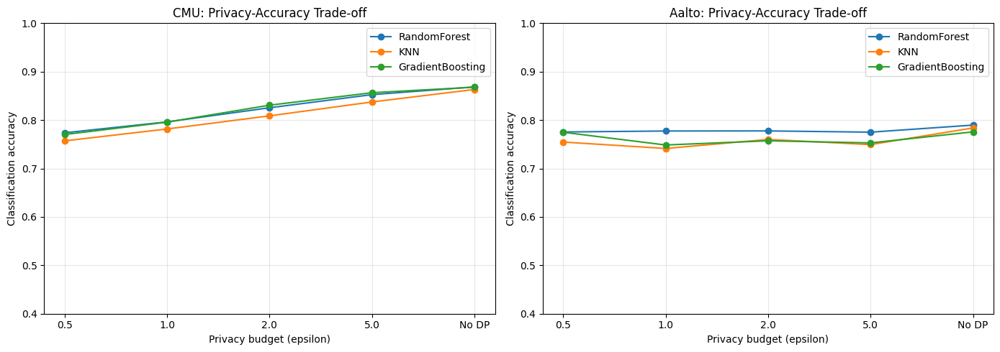

Saved plot to data/results/privacy_tradeoff.png


: 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

epsilon_values = [0.5, 1.0, 2.0, 5.0, float('inf')]
epsilon_labels = ['0.5', '1.0', '2.0', '5.0', 'No DP']

for ax, dataset_name in zip(axes, ['CMU', 'Aalto']):
    subset = summary[summary['dataset'] == dataset_name]
    
    for classifier in ['RandomForest', 'KNN', 'GradientBoosting']:
        clf_data = subset[subset['classifier'] == classifier].sort_values('epsilon')
        accuracies = clf_data['accuracy'].values
        ax.plot(range(len(epsilon_values)), accuracies, marker='o', label=classifier)
    
    ax.set_xticks(range(len(epsilon_values)))
    ax.set_xticklabels(epsilon_labels)
    ax.set_xlabel('Privacy budget (epsilon)')
    ax.set_ylabel('Classification accuracy')
    ax.set_title(f'{dataset_name}: Privacy-Accuracy Trade-off')
    ax.set_ylim(0.4, 1.0)
    ax.grid(True, alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.savefig('../data/results/privacy_tradeoff.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved plot to data/results/privacy_tradeoff.png")

In [ ]:
import sys
sys.path.append('../src')

from evaluate import zero_effort_attack_per_user, graduated_knowledge_attack, cross_dataset_attack
import pandas as pd

#Reload processed datasets
cmu_df = pd.read_parquet('../data/processed/cmu_loaded.parquet')
aalto_df = pd.read_parquet('../data/processed/aalto_loaded.parquet')

print(f"CMU: {len(cmu_df)} sessions, {cmu_df['user_id'].nunique()} users")
print(f"Aalto: {len(aalto_df)} sessions, {aalto_df['user_id'].nunique()} users")

CMU: 20400 sessions, 51 users
Aalto: 4500 sessions, 300 users


In [2]:
print("=" * 60)
print("Analysis 1: Zero-effort attack — CMU")
print("=" * 60)
cmu_attack = zero_effort_attack_per_user(cmu_df)

print("\nCMU zero-effort attack summary:")
print(f"  Mean true accept rate: {cmu_attack['true_accept_rate'].mean():.3f}")
print(f"  Mean imposter reject rate: {cmu_attack['mean_imposter_reject_rate'].mean():.3f}")
print(f"  Worst-case reject rate: {cmu_attack['min_imposter_reject_rate'].mean():.3f}")
print(f"  Most vulnerable user: {cmu_attack.loc[cmu_attack['min_imposter_reject_rate'].idxmin(), 'user_id']}")
print(f"  Their worst reject rate: {cmu_attack['min_imposter_reject_rate'].min():.3f}")

Analysis 1: Zero-effort attack — CMU
Zero-effort attack analysis for 51 users...
  Completed 25/51 users
  Completed 50/51 users
  Done. Evaluated 51 users.

CMU zero-effort attack summary:
  Mean true accept rate: 0.553
  Mean imposter reject rate: 0.929
  Worst-case reject rate: 0.518
  Most vulnerable user: s040
  Their worst reject rate: 0.188


In [3]:
print("=" * 60)
print("Analysis 1: Zero-effort attack — Aalto")
print("=" * 60)
aalto_attack = zero_effort_attack_per_user(aalto_df, max_users=100)

print("\nAalto zero-effort attack summary:")
print(f"  Mean true accept rate: {aalto_attack['true_accept_rate'].mean():.3f}")
print(f"  Mean imposter reject rate: {aalto_attack['mean_imposter_reject_rate'].mean():.3f}")
print(f"  Worst-case reject rate: {aalto_attack['min_imposter_reject_rate'].mean():.3f}")

Analysis 1: Zero-effort attack — Aalto
Zero-effort attack analysis for 100 users...
  Completed 25/100 users
  Completed 50/100 users
  Completed 75/100 users
  Completed 100/100 users
  Done. Evaluated 100 users.

Aalto zero-effort attack summary:
  Mean true accept rate: 0.462
  Mean imposter reject rate: 0.862
  Worst-case reject rate: 0.370


In [4]:
print("=" * 60)
print("Analysis 2: Graduated knowledge attack — CMU")
print("=" * 60)
cmu_graduated = graduated_knowledge_attack(
    cmu_df, 
    sample_sizes=(5, 10, 20, 50, 100, 200)
)
print("\nCMU graduated attack results:")
print(cmu_graduated.to_string(index=False))

Analysis 2: Graduated knowledge attack — CMU
Graduated knowledge attack on user s002...
  5 training samples: accept=0.023, reject=0.909
  10 training samples: accept=0.082, reject=0.914
  20 training samples: accept=0.050, reject=0.949
  50 training samples: accept=0.063, reject=0.924
  100 training samples: accept=0.137, reject=0.921
  200 training samples: accept=0.155, reject=0.907

CMU graduated attack results:
 training_samples  true_accept_rate  mean_imposter_reject_rate  test_sessions
                5          0.022785                    0.90915            395
               10          0.082051                    0.91395            390
               20          0.050000                    0.94890            380
               50          0.062857                    0.92430            350
              100          0.136667                    0.92130            300
              200          0.155000                    0.90715            200


In [5]:
print("=" * 60)
print("Analysis 2: Graduated knowledge attack — Aalto")
print("=" * 60)
aalto_graduated = graduated_knowledge_attack(
    aalto_df,
    sample_sizes=(3, 5, 8, 10, 12)
)
print("\nAalto graduated attack results:")
print(aalto_graduated.to_string(index=False))

Analysis 2: Graduated knowledge attack — Aalto
Graduated knowledge attack on user 1001...
  3 training samples: accept=0.167, reject=0.792
  5 training samples: accept=0.200, reject=0.857
  8 training samples: accept=0.000, reject=0.856
  10 training samples: accept=0.200, reject=0.804

Aalto graduated attack results:
 training_samples  true_accept_rate  mean_imposter_reject_rate  test_sessions
                3          0.166667                   0.792000             12
                5          0.200000                   0.857333             10
                8          0.000000                   0.856000              7
               10          0.200000                   0.804000              5


In [ ]:
print("=" * 60)
print("Analysis 3: Cross-dataset generalisation")
print("=" * 60)

#Train on CMU (desktop,fixed password), 
#test on Aalto (mobile,free text)
cross_cmu_to_aalto = cross_dataset_attack(
    cmu_df, aalto_df, 
    'CMU', 'Aalto',
    max_users=100
)

print()

#Train on Aalto (mobile,free text), 
#test on CMU (desktop,fixed password)
cross_aalto_to_cmu = cross_dataset_attack(
    aalto_df, cmu_df,
    'Aalto', 'CMU'
)

Analysis 3: Cross-dataset generalisation
Cross-dataset attack: train on CMU, test on Aalto...
  Training users: 51, Test users: 100
  Completed 50/100 users
  Completed 100/100 users
  Done. Mean accept: 0.914, Mean cross-reject: 0.977

Cross-dataset attack: train on Aalto, test on CMU...
  Training users: 300, Test users: 51
  Completed 50/51 users
  Done. Mean accept: 0.982, Mean cross-reject: 1.000


In [ ]:
#Save per-user attack results
cmu_attack.to_csv('../data/results/cmu_attack_per_user.csv', index=False)
aalto_attack.to_csv('../data/results/aalto_attack_per_user.csv', index=False)

#Save graduated results
cmu_graduated.to_csv('../data/results/cmu_graduated_attack.csv', index=False)
aalto_graduated.to_csv('../data/results/aalto_graduated_attack.csv', index=False)

#Save cross-dataset results
cross_results = pd.concat([cross_cmu_to_aalto, cross_aalto_to_cmu], ignore_index=True)
cross_results.to_csv('../data/results/cross_dataset_attack.csv', index=False)

#Summary table
print("=" * 60)
print("ATTACK SIMULATION SUMMARY")
print("=" * 60)
print(f"\nZero-effort attack resistance:")
print(f"  CMU mean reject rate:   {cmu_attack['mean_imposter_reject_rate'].mean():.1%}")
print(f"  Aalto mean reject rate: {aalto_attack['mean_imposter_reject_rate'].mean():.1%}")
print(f"\nCross-dataset generalisation:")
print(f"  CMU→Aalto reject rate:  {cross_cmu_to_aalto['cross_reject_rate'].mean():.1%}")
print(f"  Aalto→CMU reject rate:  {cross_aalto_to_cmu['cross_reject_rate'].mean():.1%}")

print("\nAll results saved to data/results/")

ATTACK SIMULATION SUMMARY

Zero-effort attack resistance:
  CMU mean reject rate:   92.9%
  Aalto mean reject rate: 86.2%

Cross-dataset generalisation:
  CMU→Aalto reject rate:  97.7%
  Aalto→CMU reject rate:  100.0%

All results saved to data/results/


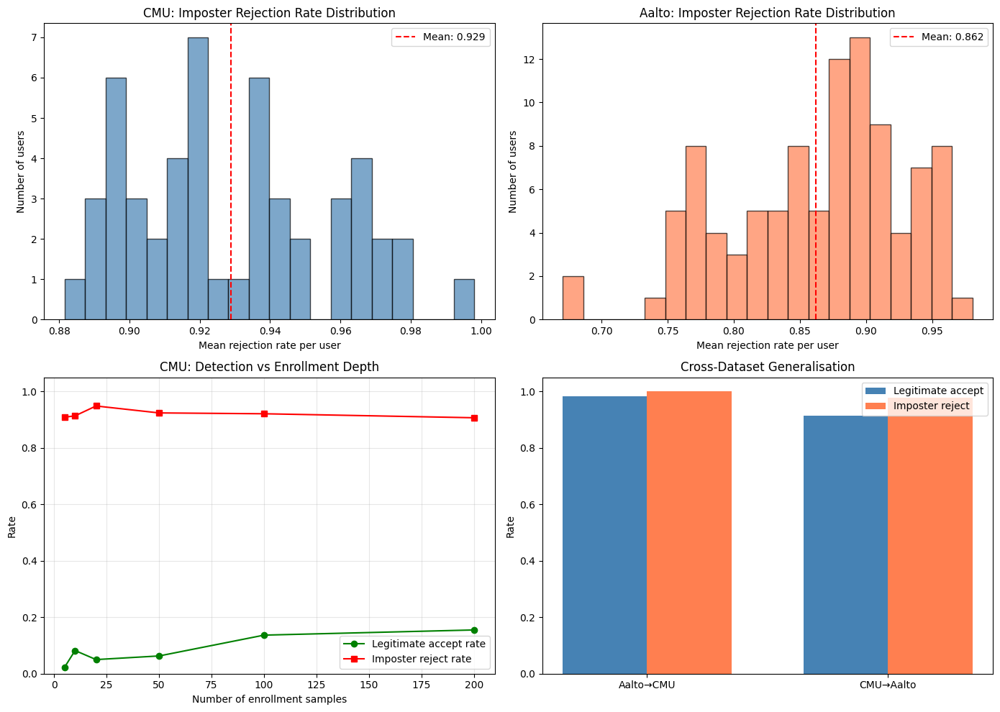

Saved plot to data/results/attack_simulation.png


In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

#First plot=Zero-effort reject rate distribution (CMU)
ax = axes[0, 0]
ax.hist(cmu_attack['mean_imposter_reject_rate'], bins=20, 
        color='steelblue', edgecolor='black', alpha=0.7)
ax.set_title('CMU: Imposter Rejection Rate Distribution')
ax.set_xlabel('Mean rejection rate per user')
ax.set_ylabel('Number of users')
ax.axvline(cmu_attack['mean_imposter_reject_rate'].mean(), 
           color='red', linestyle='--', label=f"Mean: {cmu_attack['mean_imposter_reject_rate'].mean():.3f}")
ax.legend()

#Second plot=Zero-effort reject rate distribution (Aalto)
ax = axes[0, 1]
ax.hist(aalto_attack['mean_imposter_reject_rate'], bins=20,
        color='coral', edgecolor='black', alpha=0.7)
ax.set_title('Aalto: Imposter Rejection Rate Distribution')
ax.set_xlabel('Mean rejection rate per user')
ax.set_ylabel('Number of users')
ax.axvline(aalto_attack['mean_imposter_reject_rate'].mean(),
           color='red', linestyle='--', label=f"Mean: {aalto_attack['mean_imposter_reject_rate'].mean():.3f}")
ax.legend()

#Third plot=Graduated knowledge attack (CMU)
ax = axes[1, 0]
ax.plot(cmu_graduated['training_samples'], cmu_graduated['true_accept_rate'],
        'g-o', label='Legitimate accept rate')
ax.plot(cmu_graduated['training_samples'], cmu_graduated['mean_imposter_reject_rate'],
        'r-s', label='Imposter reject rate')
ax.set_title('CMU: Detection vs Enrollment Depth')
ax.set_xlabel('Number of enrollment samples')
ax.set_ylabel('Rate')
ax.set_ylim(0, 1.05)
ax.legend()
ax.grid(True, alpha=0.3)

#Fourth plot=Cross-dataset generalisation
ax = axes[1, 1]
cross_summary = cross_results.groupby(['train_dataset', 'test_dataset']).agg(
    accept=('true_accept_rate', 'mean'),
    reject=('cross_reject_rate', 'mean')
).reset_index()
labels = [f"{row['train_dataset']}→{row['test_dataset']}" for _, row in cross_summary.iterrows()]
x = range(len(labels))
width = 0.35
ax.bar([i - width/2 for i in x], cross_summary['accept'], width, 
       label='Legitimate accept', color='steelblue')
ax.bar([i + width/2 for i in x], cross_summary['reject'], width,
       label='Imposter reject', color='coral')
ax.set_title('Cross-Dataset Generalisation')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_ylabel('Rate')
ax.set_ylim(0, 1.05)
ax.legend()

plt.tight_layout()
plt.savefig('../data/results/attack_simulation.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved plot to data/results/attack_simulation.png")